# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

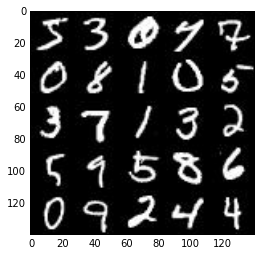

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

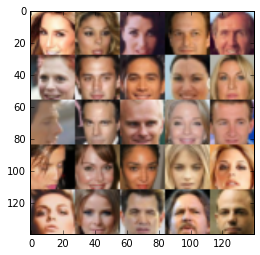

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.5.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, (None, image_width,image_height, image_channels), name='input_real')
    z_input = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return real_input, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 2x2X512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid', activation=None)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same', activation=None)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14X28X128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=2, padding='same', activation=None)
        # 28x28x3 now
        
        out = tf.tanh(logits)
    return out        


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    # Smoothing 
    smooth = 0.1   
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    _, image_width, image_height, image_channels = data_shape
    
    real_input, z_input, lr = model_inputs(image_width, image_height, image_channels, z_dim)
        
    d_loss, g_loss = model_loss(real_input, z_input, image_channels)                                                      
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    losses = []
    steps = 0
    print_every=10
    show_every=100
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images  in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={
                        real_input: batch_images, z_input: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={
                        real_input: batch_images, z_input: batch_z, lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_input, image_channels, data_image_mode)
        


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5344... Generator Loss: 2.2011
Epoch 1/2... Discriminator Loss: 0.5552... Generator Loss: 11.2288
Epoch 1/2... Discriminator Loss: 0.5882... Generator Loss: 12.5894
Epoch 1/2... Discriminator Loss: 0.6907... Generator Loss: 7.0255
Epoch 1/2... Discriminator Loss: 2.3299... Generator Loss: 15.7266
Epoch 1/2... Discriminator Loss: 2.1618... Generator Loss: 13.8268
Epoch 1/2... Discriminator Loss: 1.2472... Generator Loss: 11.3416
Epoch 1/2... Discriminator Loss: 0.3934... Generator Loss: 6.3266
Epoch 1/2... Discriminator Loss: 4.9268... Generator Loss: 0.0136
Epoch 1/2... Discriminator Loss: 2.0554... Generator Loss: 8.4755


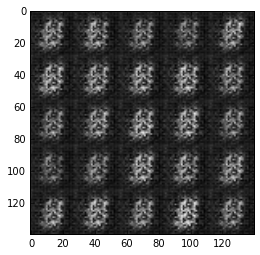

Epoch 1/2... Discriminator Loss: 0.6640... Generator Loss: 1.6867
Epoch 1/2... Discriminator Loss: 0.8436... Generator Loss: 1.0296
Epoch 1/2... Discriminator Loss: 0.5493... Generator Loss: 2.4566
Epoch 1/2... Discriminator Loss: 0.8155... Generator Loss: 1.1427
Epoch 1/2... Discriminator Loss: 0.6465... Generator Loss: 3.1935
Epoch 1/2... Discriminator Loss: 0.7351... Generator Loss: 1.5198
Epoch 1/2... Discriminator Loss: 0.5047... Generator Loss: 3.0265
Epoch 1/2... Discriminator Loss: 0.5918... Generator Loss: 1.8240
Epoch 1/2... Discriminator Loss: 0.8087... Generator Loss: 1.3658
Epoch 1/2... Discriminator Loss: 0.6406... Generator Loss: 1.8921


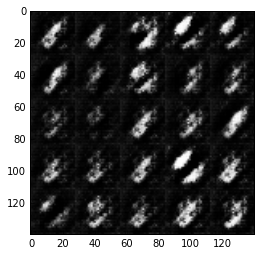

Epoch 1/2... Discriminator Loss: 0.8025... Generator Loss: 1.2173
Epoch 1/2... Discriminator Loss: 0.6225... Generator Loss: 2.1574
Epoch 1/2... Discriminator Loss: 0.8555... Generator Loss: 1.1610
Epoch 1/2... Discriminator Loss: 1.0385... Generator Loss: 0.9615
Epoch 1/2... Discriminator Loss: 0.8628... Generator Loss: 1.0669
Epoch 1/2... Discriminator Loss: 0.5915... Generator Loss: 2.0551
Epoch 1/2... Discriminator Loss: 2.2315... Generator Loss: 4.3212
Epoch 1/2... Discriminator Loss: 1.2703... Generator Loss: 0.6237
Epoch 1/2... Discriminator Loss: 1.3187... Generator Loss: 3.1387
Epoch 1/2... Discriminator Loss: 1.2804... Generator Loss: 0.6747


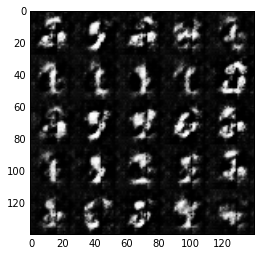

Epoch 1/2... Discriminator Loss: 0.9244... Generator Loss: 1.1469
Epoch 1/2... Discriminator Loss: 1.0673... Generator Loss: 2.8416
Epoch 1/2... Discriminator Loss: 1.0669... Generator Loss: 1.2115
Epoch 1/2... Discriminator Loss: 1.0426... Generator Loss: 2.9284
Epoch 1/2... Discriminator Loss: 1.1086... Generator Loss: 2.2145
Epoch 1/2... Discriminator Loss: 0.9770... Generator Loss: 1.1219
Epoch 1/2... Discriminator Loss: 0.8638... Generator Loss: 1.5602
Epoch 1/2... Discriminator Loss: 1.1425... Generator Loss: 1.8416
Epoch 1/2... Discriminator Loss: 0.9636... Generator Loss: 1.1362
Epoch 1/2... Discriminator Loss: 0.8852... Generator Loss: 1.1218


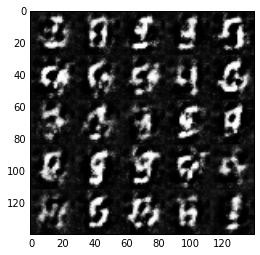

Epoch 1/2... Discriminator Loss: 1.3937... Generator Loss: 0.5253
Epoch 1/2... Discriminator Loss: 0.7821... Generator Loss: 2.1423
Epoch 1/2... Discriminator Loss: 0.9664... Generator Loss: 1.9324
Epoch 1/2... Discriminator Loss: 1.2008... Generator Loss: 1.1247
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 0.6788
Epoch 1/2... Discriminator Loss: 0.9569... Generator Loss: 1.5017
Epoch 1/2... Discriminator Loss: 0.8131... Generator Loss: 1.3072
Epoch 1/2... Discriminator Loss: 1.1980... Generator Loss: 3.0858
Epoch 1/2... Discriminator Loss: 0.9401... Generator Loss: 1.0014
Epoch 1/2... Discriminator Loss: 1.2803... Generator Loss: 0.5966


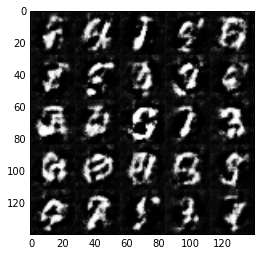

Epoch 1/2... Discriminator Loss: 1.5738... Generator Loss: 0.4224
Epoch 1/2... Discriminator Loss: 0.8315... Generator Loss: 1.3638
Epoch 1/2... Discriminator Loss: 0.7521... Generator Loss: 1.3679
Epoch 1/2... Discriminator Loss: 0.8308... Generator Loss: 1.3482
Epoch 1/2... Discriminator Loss: 1.2991... Generator Loss: 2.3052
Epoch 1/2... Discriminator Loss: 1.1306... Generator Loss: 2.5374
Epoch 1/2... Discriminator Loss: 0.9328... Generator Loss: 1.6780
Epoch 1/2... Discriminator Loss: 0.9226... Generator Loss: 1.0520
Epoch 1/2... Discriminator Loss: 0.9016... Generator Loss: 0.9953
Epoch 1/2... Discriminator Loss: 1.3282... Generator Loss: 0.5138


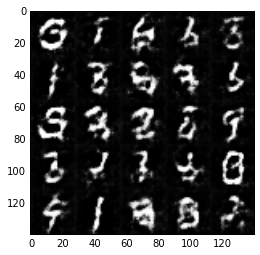

Epoch 1/2... Discriminator Loss: 0.8783... Generator Loss: 1.8921
Epoch 1/2... Discriminator Loss: 1.1199... Generator Loss: 0.7022
Epoch 1/2... Discriminator Loss: 1.1245... Generator Loss: 0.6967
Epoch 1/2... Discriminator Loss: 0.9198... Generator Loss: 1.0571
Epoch 1/2... Discriminator Loss: 1.0554... Generator Loss: 0.8615
Epoch 1/2... Discriminator Loss: 0.9492... Generator Loss: 0.9784
Epoch 1/2... Discriminator Loss: 1.4849... Generator Loss: 2.5103
Epoch 1/2... Discriminator Loss: 0.9105... Generator Loss: 1.9483
Epoch 1/2... Discriminator Loss: 0.9767... Generator Loss: 0.9297
Epoch 1/2... Discriminator Loss: 0.8602... Generator Loss: 1.1180


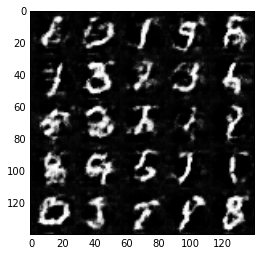

Epoch 1/2... Discriminator Loss: 1.2838... Generator Loss: 0.5499
Epoch 1/2... Discriminator Loss: 1.1966... Generator Loss: 0.6836
Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.6520
Epoch 1/2... Discriminator Loss: 1.6453... Generator Loss: 0.3686
Epoch 1/2... Discriminator Loss: 1.2473... Generator Loss: 0.6031
Epoch 1/2... Discriminator Loss: 0.7819... Generator Loss: 1.8092
Epoch 1/2... Discriminator Loss: 1.0860... Generator Loss: 1.6039
Epoch 1/2... Discriminator Loss: 1.1471... Generator Loss: 1.8689
Epoch 1/2... Discriminator Loss: 1.2217... Generator Loss: 0.6031
Epoch 1/2... Discriminator Loss: 1.9343... Generator Loss: 0.2592


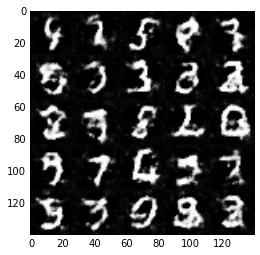

Epoch 1/2... Discriminator Loss: 1.0258... Generator Loss: 0.7519
Epoch 1/2... Discriminator Loss: 1.2915... Generator Loss: 0.5714
Epoch 1/2... Discriminator Loss: 1.0094... Generator Loss: 0.9649
Epoch 1/2... Discriminator Loss: 0.9000... Generator Loss: 1.0197
Epoch 1/2... Discriminator Loss: 1.0045... Generator Loss: 1.7760
Epoch 1/2... Discriminator Loss: 0.9324... Generator Loss: 1.3334
Epoch 1/2... Discriminator Loss: 0.9990... Generator Loss: 0.9063
Epoch 1/2... Discriminator Loss: 2.1239... Generator Loss: 2.4923
Epoch 1/2... Discriminator Loss: 1.1506... Generator Loss: 0.6773
Epoch 1/2... Discriminator Loss: 1.0804... Generator Loss: 0.7239


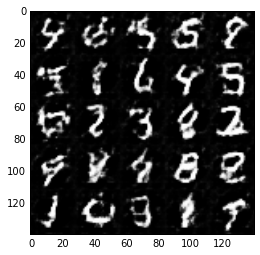

Epoch 1/2... Discriminator Loss: 0.9223... Generator Loss: 1.0212
Epoch 1/2... Discriminator Loss: 1.1211... Generator Loss: 2.2138
Epoch 1/2... Discriminator Loss: 1.2442... Generator Loss: 1.2565
Epoch 1/2... Discriminator Loss: 1.0616... Generator Loss: 0.7896
Epoch 1/2... Discriminator Loss: 0.9104... Generator Loss: 1.1139
Epoch 1/2... Discriminator Loss: 0.9782... Generator Loss: 1.8234
Epoch 1/2... Discriminator Loss: 1.4247... Generator Loss: 0.4700
Epoch 1/2... Discriminator Loss: 1.8041... Generator Loss: 3.0982
Epoch 1/2... Discriminator Loss: 1.1221... Generator Loss: 0.6625
Epoch 1/2... Discriminator Loss: 1.4308... Generator Loss: 0.4802


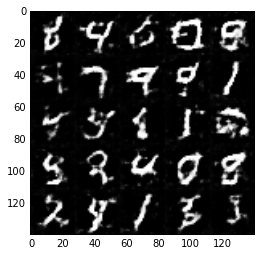

Epoch 1/2... Discriminator Loss: 0.9777... Generator Loss: 0.8333
Epoch 1/2... Discriminator Loss: 1.5028... Generator Loss: 0.5547
Epoch 1/2... Discriminator Loss: 1.0311... Generator Loss: 0.7656
Epoch 1/2... Discriminator Loss: 1.2239... Generator Loss: 0.6253
Epoch 1/2... Discriminator Loss: 0.7921... Generator Loss: 1.7372
Epoch 1/2... Discriminator Loss: 1.5632... Generator Loss: 2.2194
Epoch 1/2... Discriminator Loss: 0.9436... Generator Loss: 1.0220
Epoch 1/2... Discriminator Loss: 0.9299... Generator Loss: 1.0073
Epoch 1/2... Discriminator Loss: 1.0151... Generator Loss: 0.7588
Epoch 1/2... Discriminator Loss: 1.1411... Generator Loss: 0.6595


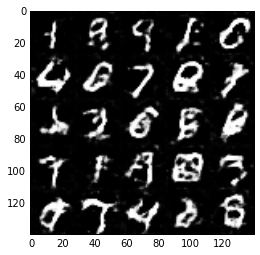

Epoch 1/2... Discriminator Loss: 0.9461... Generator Loss: 1.0098
Epoch 1/2... Discriminator Loss: 0.9527... Generator Loss: 1.4203
Epoch 1/2... Discriminator Loss: 0.9792... Generator Loss: 0.9205
Epoch 1/2... Discriminator Loss: 1.0378... Generator Loss: 1.0154
Epoch 1/2... Discriminator Loss: 0.8871... Generator Loss: 1.6420
Epoch 1/2... Discriminator Loss: 1.3208... Generator Loss: 1.6927
Epoch 1/2... Discriminator Loss: 1.1226... Generator Loss: 0.6919
Epoch 1/2... Discriminator Loss: 1.1885... Generator Loss: 0.6183
Epoch 1/2... Discriminator Loss: 0.8949... Generator Loss: 1.1867
Epoch 1/2... Discriminator Loss: 1.1272... Generator Loss: 2.2824


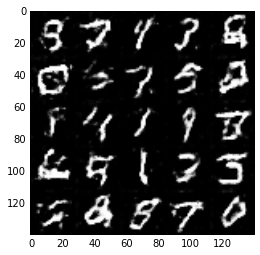

Epoch 1/2... Discriminator Loss: 1.2174... Generator Loss: 0.6451
Epoch 1/2... Discriminator Loss: 0.8985... Generator Loss: 1.5285
Epoch 1/2... Discriminator Loss: 0.8909... Generator Loss: 1.0006
Epoch 1/2... Discriminator Loss: 1.0434... Generator Loss: 0.8228
Epoch 1/2... Discriminator Loss: 0.8324... Generator Loss: 1.2612
Epoch 1/2... Discriminator Loss: 0.9010... Generator Loss: 1.1770
Epoch 1/2... Discriminator Loss: 0.9453... Generator Loss: 1.1193
Epoch 1/2... Discriminator Loss: 0.9198... Generator Loss: 0.9982
Epoch 1/2... Discriminator Loss: 1.5550... Generator Loss: 0.4721
Epoch 1/2... Discriminator Loss: 1.7866... Generator Loss: 0.3459


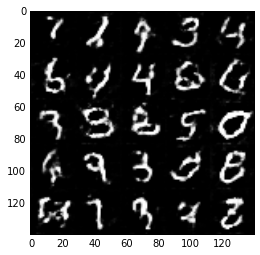

Epoch 1/2... Discriminator Loss: 0.8180... Generator Loss: 1.7555
Epoch 1/2... Discriminator Loss: 1.3179... Generator Loss: 0.5545
Epoch 1/2... Discriminator Loss: 1.0025... Generator Loss: 0.9122
Epoch 1/2... Discriminator Loss: 0.9808... Generator Loss: 2.4679
Epoch 1/2... Discriminator Loss: 1.2119... Generator Loss: 0.6245
Epoch 1/2... Discriminator Loss: 1.7133... Generator Loss: 0.3468
Epoch 1/2... Discriminator Loss: 0.8797... Generator Loss: 1.0397
Epoch 1/2... Discriminator Loss: 0.7798... Generator Loss: 1.2059
Epoch 1/2... Discriminator Loss: 0.7503... Generator Loss: 1.6564
Epoch 1/2... Discriminator Loss: 1.3628... Generator Loss: 0.5372


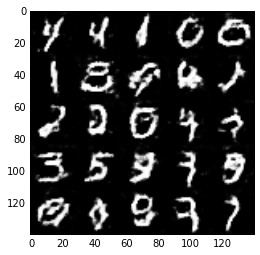

Epoch 1/2... Discriminator Loss: 0.8912... Generator Loss: 1.6272
Epoch 1/2... Discriminator Loss: 0.8605... Generator Loss: 1.5506
Epoch 1/2... Discriminator Loss: 0.9255... Generator Loss: 0.9979
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.0088... Generator Loss: 0.8468
Epoch 1/2... Discriminator Loss: 1.2313... Generator Loss: 1.3167
Epoch 1/2... Discriminator Loss: 0.9928... Generator Loss: 0.8996
Epoch 1/2... Discriminator Loss: 1.0057... Generator Loss: 0.8097
Epoch 1/2... Discriminator Loss: 1.2796... Generator Loss: 1.3729
Epoch 1/2... Discriminator Loss: 2.4942... Generator Loss: 3.9065


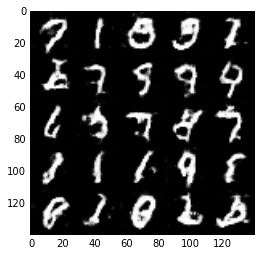

Epoch 1/2... Discriminator Loss: 1.2008... Generator Loss: 0.7360
Epoch 1/2... Discriminator Loss: 0.9016... Generator Loss: 0.9919
Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 0.6376
Epoch 1/2... Discriminator Loss: 0.8945... Generator Loss: 0.9921
Epoch 1/2... Discriminator Loss: 1.0146... Generator Loss: 2.3927
Epoch 1/2... Discriminator Loss: 1.1309... Generator Loss: 1.2251
Epoch 1/2... Discriminator Loss: 0.9205... Generator Loss: 1.9866
Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 0.7867
Epoch 1/2... Discriminator Loss: 0.9832... Generator Loss: 1.0301
Epoch 1/2... Discriminator Loss: 0.9399... Generator Loss: 0.9788


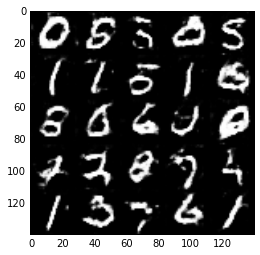

Epoch 1/2... Discriminator Loss: 1.4726... Generator Loss: 0.4421
Epoch 1/2... Discriminator Loss: 1.4865... Generator Loss: 0.4475
Epoch 1/2... Discriminator Loss: 0.8142... Generator Loss: 1.1288
Epoch 1/2... Discriminator Loss: 0.8424... Generator Loss: 1.0618
Epoch 1/2... Discriminator Loss: 0.7239... Generator Loss: 1.5283
Epoch 1/2... Discriminator Loss: 1.5130... Generator Loss: 0.4775
Epoch 1/2... Discriminator Loss: 0.9289... Generator Loss: 1.0544
Epoch 1/2... Discriminator Loss: 0.6408... Generator Loss: 1.7235
Epoch 1/2... Discriminator Loss: 1.9741... Generator Loss: 0.2834
Epoch 1/2... Discriminator Loss: 1.0029... Generator Loss: 0.7864


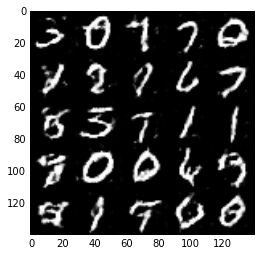

Epoch 1/2... Discriminator Loss: 1.4543... Generator Loss: 0.5407
Epoch 1/2... Discriminator Loss: 0.8479... Generator Loss: 2.0327
Epoch 1/2... Discriminator Loss: 1.0730... Generator Loss: 0.8917
Epoch 1/2... Discriminator Loss: 0.8606... Generator Loss: 1.4874
Epoch 1/2... Discriminator Loss: 0.7388... Generator Loss: 1.2818
Epoch 1/2... Discriminator Loss: 0.9775... Generator Loss: 0.9592
Epoch 1/2... Discriminator Loss: 0.9494... Generator Loss: 0.9539
Epoch 1/2... Discriminator Loss: 0.8961... Generator Loss: 0.9991
Epoch 1/2... Discriminator Loss: 0.9524... Generator Loss: 0.9097
Epoch 1/2... Discriminator Loss: 0.7399... Generator Loss: 1.8641


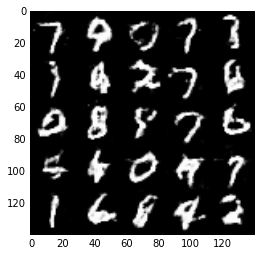

Epoch 1/2... Discriminator Loss: 0.8579... Generator Loss: 1.1924
Epoch 1/2... Discriminator Loss: 0.7666... Generator Loss: 1.4771
Epoch 1/2... Discriminator Loss: 0.8746... Generator Loss: 1.2630
Epoch 1/2... Discriminator Loss: 0.9150... Generator Loss: 1.7697
Epoch 1/2... Discriminator Loss: 1.4366... Generator Loss: 0.4438
Epoch 1/2... Discriminator Loss: 1.8139... Generator Loss: 0.3058
Epoch 1/2... Discriminator Loss: 1.2641... Generator Loss: 0.5809
Epoch 2/2... Discriminator Loss: 0.6613... Generator Loss: 1.5576
Epoch 2/2... Discriminator Loss: 0.8780... Generator Loss: 0.9443
Epoch 2/2... Discriminator Loss: 0.7351... Generator Loss: 1.2519


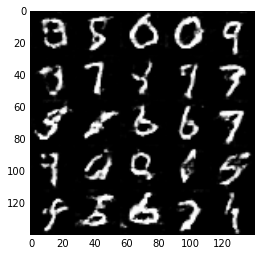

Epoch 2/2... Discriminator Loss: 1.2602... Generator Loss: 0.5946
Epoch 2/2... Discriminator Loss: 0.7959... Generator Loss: 1.1254
Epoch 2/2... Discriminator Loss: 1.1205... Generator Loss: 0.6941
Epoch 2/2... Discriminator Loss: 1.0234... Generator Loss: 1.4576
Epoch 2/2... Discriminator Loss: 0.7028... Generator Loss: 1.4180
Epoch 2/2... Discriminator Loss: 1.1845... Generator Loss: 0.6789
Epoch 2/2... Discriminator Loss: 1.3576... Generator Loss: 0.5494
Epoch 2/2... Discriminator Loss: 0.9070... Generator Loss: 1.0727
Epoch 2/2... Discriminator Loss: 1.0514... Generator Loss: 0.7617
Epoch 2/2... Discriminator Loss: 0.9323... Generator Loss: 1.5127


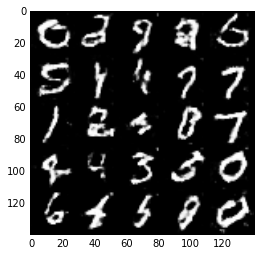

Epoch 2/2... Discriminator Loss: 1.0338... Generator Loss: 2.0164
Epoch 2/2... Discriminator Loss: 0.7256... Generator Loss: 1.3361
Epoch 2/2... Discriminator Loss: 1.0434... Generator Loss: 0.7985
Epoch 2/2... Discriminator Loss: 0.7741... Generator Loss: 1.3174
Epoch 2/2... Discriminator Loss: 0.8461... Generator Loss: 1.1121
Epoch 2/2... Discriminator Loss: 0.8674... Generator Loss: 0.9916
Epoch 2/2... Discriminator Loss: 1.1180... Generator Loss: 1.8742
Epoch 2/2... Discriminator Loss: 1.0362... Generator Loss: 0.7769
Epoch 2/2... Discriminator Loss: 1.1792... Generator Loss: 0.7244
Epoch 2/2... Discriminator Loss: 3.0680... Generator Loss: 0.1166


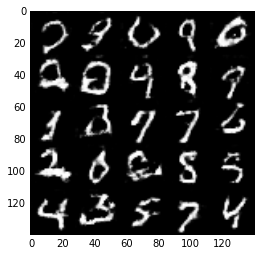

Epoch 2/2... Discriminator Loss: 1.3401... Generator Loss: 0.5335
Epoch 2/2... Discriminator Loss: 0.9959... Generator Loss: 0.8830
Epoch 2/2... Discriminator Loss: 0.7363... Generator Loss: 1.3378
Epoch 2/2... Discriminator Loss: 0.9048... Generator Loss: 1.0385
Epoch 2/2... Discriminator Loss: 1.7456... Generator Loss: 0.3512
Epoch 2/2... Discriminator Loss: 1.1013... Generator Loss: 0.7258
Epoch 2/2... Discriminator Loss: 1.4157... Generator Loss: 0.5340
Epoch 2/2... Discriminator Loss: 1.0749... Generator Loss: 1.8858
Epoch 2/2... Discriminator Loss: 1.0225... Generator Loss: 0.8513
Epoch 2/2... Discriminator Loss: 0.6889... Generator Loss: 1.4978


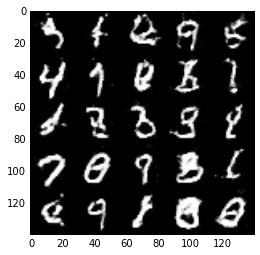

Epoch 2/2... Discriminator Loss: 0.8191... Generator Loss: 1.1484
Epoch 2/2... Discriminator Loss: 0.8241... Generator Loss: 1.9837
Epoch 2/2... Discriminator Loss: 0.8137... Generator Loss: 1.1434
Epoch 2/2... Discriminator Loss: 1.0851... Generator Loss: 1.9530
Epoch 2/2... Discriminator Loss: 0.7524... Generator Loss: 1.2881
Epoch 2/2... Discriminator Loss: 1.0328... Generator Loss: 2.5163
Epoch 2/2... Discriminator Loss: 2.1074... Generator Loss: 0.3192
Epoch 2/2... Discriminator Loss: 0.8667... Generator Loss: 0.9838
Epoch 2/2... Discriminator Loss: 0.8402... Generator Loss: 1.0928
Epoch 2/2... Discriminator Loss: 1.4284... Generator Loss: 0.4984


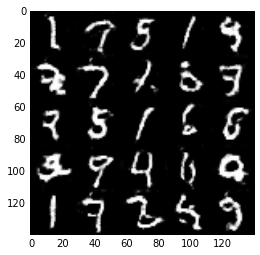

Epoch 2/2... Discriminator Loss: 0.8661... Generator Loss: 2.0348
Epoch 2/2... Discriminator Loss: 2.1301... Generator Loss: 4.2957
Epoch 2/2... Discriminator Loss: 1.8294... Generator Loss: 0.3130
Epoch 2/2... Discriminator Loss: 1.0016... Generator Loss: 0.8905
Epoch 2/2... Discriminator Loss: 0.6670... Generator Loss: 1.4243
Epoch 2/2... Discriminator Loss: 0.7516... Generator Loss: 1.2849
Epoch 2/2... Discriminator Loss: 1.3097... Generator Loss: 3.1541
Epoch 2/2... Discriminator Loss: 0.9901... Generator Loss: 0.9128
Epoch 2/2... Discriminator Loss: 0.7437... Generator Loss: 1.3845
Epoch 2/2... Discriminator Loss: 0.7493... Generator Loss: 1.4890


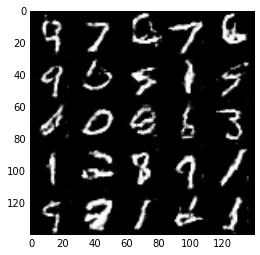

Epoch 2/2... Discriminator Loss: 1.9267... Generator Loss: 3.5023
Epoch 2/2... Discriminator Loss: 0.7535... Generator Loss: 1.4882
Epoch 2/2... Discriminator Loss: 0.8892... Generator Loss: 1.0016
Epoch 2/2... Discriminator Loss: 1.5367... Generator Loss: 0.4884
Epoch 2/2... Discriminator Loss: 0.9211... Generator Loss: 1.0941
Epoch 2/2... Discriminator Loss: 1.2615... Generator Loss: 0.7581
Epoch 2/2... Discriminator Loss: 1.6791... Generator Loss: 0.3590
Epoch 2/2... Discriminator Loss: 1.2768... Generator Loss: 0.5616
Epoch 2/2... Discriminator Loss: 0.8791... Generator Loss: 0.9929
Epoch 2/2... Discriminator Loss: 1.2656... Generator Loss: 0.5887


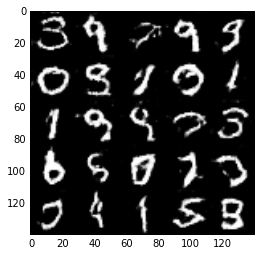

Epoch 2/2... Discriminator Loss: 0.9938... Generator Loss: 1.9737
Epoch 2/2... Discriminator Loss: 1.6564... Generator Loss: 0.3880
Epoch 2/2... Discriminator Loss: 1.1328... Generator Loss: 0.7104
Epoch 2/2... Discriminator Loss: 0.8953... Generator Loss: 1.0803
Epoch 2/2... Discriminator Loss: 1.2907... Generator Loss: 0.5539
Epoch 2/2... Discriminator Loss: 1.3363... Generator Loss: 0.5739
Epoch 2/2... Discriminator Loss: 0.6944... Generator Loss: 1.3803
Epoch 2/2... Discriminator Loss: 1.7120... Generator Loss: 3.7598
Epoch 2/2... Discriminator Loss: 0.8833... Generator Loss: 1.0558
Epoch 2/2... Discriminator Loss: 0.9373... Generator Loss: 2.4494


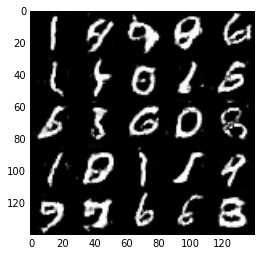

Epoch 2/2... Discriminator Loss: 1.1941... Generator Loss: 0.6388
Epoch 2/2... Discriminator Loss: 0.7252... Generator Loss: 1.3357
Epoch 2/2... Discriminator Loss: 1.2180... Generator Loss: 0.6535
Epoch 2/2... Discriminator Loss: 1.6080... Generator Loss: 0.4727
Epoch 2/2... Discriminator Loss: 0.8055... Generator Loss: 1.3735
Epoch 2/2... Discriminator Loss: 0.6678... Generator Loss: 1.9111
Epoch 2/2... Discriminator Loss: 0.8636... Generator Loss: 1.0817
Epoch 2/2... Discriminator Loss: 0.8003... Generator Loss: 1.4740
Epoch 2/2... Discriminator Loss: 0.6529... Generator Loss: 1.5044
Epoch 2/2... Discriminator Loss: 1.0838... Generator Loss: 0.7738


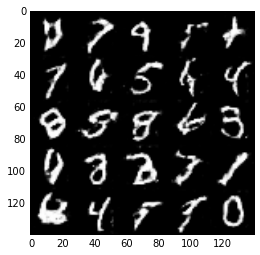

Epoch 2/2... Discriminator Loss: 0.8968... Generator Loss: 1.0152
Epoch 2/2... Discriminator Loss: 0.9986... Generator Loss: 0.8691
Epoch 2/2... Discriminator Loss: 1.6178... Generator Loss: 0.4382
Epoch 2/2... Discriminator Loss: 1.5904... Generator Loss: 0.4571
Epoch 2/2... Discriminator Loss: 1.6437... Generator Loss: 0.5109
Epoch 2/2... Discriminator Loss: 1.8622... Generator Loss: 0.3876
Epoch 2/2... Discriminator Loss: 0.8326... Generator Loss: 1.1408
Epoch 2/2... Discriminator Loss: 0.6748... Generator Loss: 1.5927
Epoch 2/2... Discriminator Loss: 1.2383... Generator Loss: 0.6470
Epoch 2/2... Discriminator Loss: 0.9011... Generator Loss: 0.9973


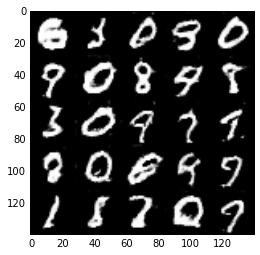

Epoch 2/2... Discriminator Loss: 0.7052... Generator Loss: 1.6426
Epoch 2/2... Discriminator Loss: 0.8140... Generator Loss: 1.1063
Epoch 2/2... Discriminator Loss: 0.6873... Generator Loss: 1.4014
Epoch 2/2... Discriminator Loss: 1.1504... Generator Loss: 0.7525
Epoch 2/2... Discriminator Loss: 1.8589... Generator Loss: 0.3120
Epoch 2/2... Discriminator Loss: 0.9744... Generator Loss: 0.9193
Epoch 2/2... Discriminator Loss: 0.7149... Generator Loss: 1.4490
Epoch 2/2... Discriminator Loss: 0.7580... Generator Loss: 1.2377
Epoch 2/2... Discriminator Loss: 0.7592... Generator Loss: 1.2531
Epoch 2/2... Discriminator Loss: 1.6570... Generator Loss: 0.5100


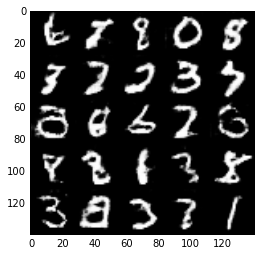

Epoch 2/2... Discriminator Loss: 0.6554... Generator Loss: 1.8710
Epoch 2/2... Discriminator Loss: 0.8595... Generator Loss: 1.0658
Epoch 2/2... Discriminator Loss: 0.9355... Generator Loss: 1.0464
Epoch 2/2... Discriminator Loss: 0.7998... Generator Loss: 1.2577
Epoch 2/2... Discriminator Loss: 0.7649... Generator Loss: 1.2422
Epoch 2/2... Discriminator Loss: 1.0082... Generator Loss: 0.8457
Epoch 2/2... Discriminator Loss: 0.7706... Generator Loss: 2.1581
Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 1.0039
Epoch 2/2... Discriminator Loss: 0.9122... Generator Loss: 1.6331
Epoch 2/2... Discriminator Loss: 0.6616... Generator Loss: 1.5117


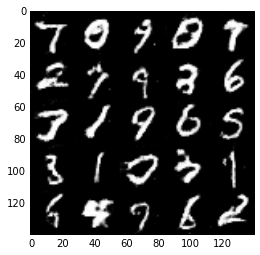

Epoch 2/2... Discriminator Loss: 0.8283... Generator Loss: 1.1209
Epoch 2/2... Discriminator Loss: 0.5990... Generator Loss: 1.7208
Epoch 2/2... Discriminator Loss: 0.7971... Generator Loss: 1.1769
Epoch 2/2... Discriminator Loss: 1.2890... Generator Loss: 0.5347
Epoch 2/2... Discriminator Loss: 0.8315... Generator Loss: 1.0853
Epoch 2/2... Discriminator Loss: 0.6822... Generator Loss: 1.4177
Epoch 2/2... Discriminator Loss: 0.6152... Generator Loss: 1.6379
Epoch 2/2... Discriminator Loss: 2.1790... Generator Loss: 0.2696
Epoch 2/2... Discriminator Loss: 1.9293... Generator Loss: 0.4308
Epoch 2/2... Discriminator Loss: 1.1586... Generator Loss: 0.7996


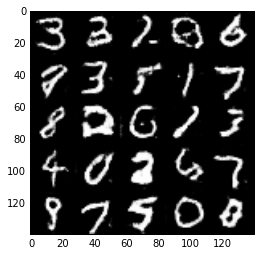

Epoch 2/2... Discriminator Loss: 0.7072... Generator Loss: 1.4359
Epoch 2/2... Discriminator Loss: 0.6921... Generator Loss: 1.7850
Epoch 2/2... Discriminator Loss: 0.8042... Generator Loss: 1.3243
Epoch 2/2... Discriminator Loss: 1.1020... Generator Loss: 0.7532
Epoch 2/2... Discriminator Loss: 0.7846... Generator Loss: 1.3478
Epoch 2/2... Discriminator Loss: 0.9011... Generator Loss: 0.9855
Epoch 2/2... Discriminator Loss: 1.0190... Generator Loss: 0.8609
Epoch 2/2... Discriminator Loss: 0.9977... Generator Loss: 0.8914
Epoch 2/2... Discriminator Loss: 1.5219... Generator Loss: 0.4869
Epoch 2/2... Discriminator Loss: 1.0435... Generator Loss: 0.9045


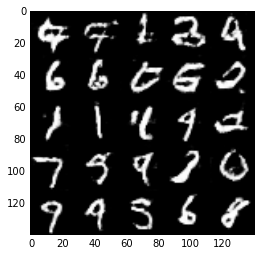

Epoch 2/2... Discriminator Loss: 1.0595... Generator Loss: 2.3277
Epoch 2/2... Discriminator Loss: 0.9917... Generator Loss: 1.6328
Epoch 2/2... Discriminator Loss: 1.1737... Generator Loss: 0.6965
Epoch 2/2... Discriminator Loss: 0.7386... Generator Loss: 1.5183
Epoch 2/2... Discriminator Loss: 0.6845... Generator Loss: 1.3807
Epoch 2/2... Discriminator Loss: 0.7505... Generator Loss: 1.2644
Epoch 2/2... Discriminator Loss: 1.2690... Generator Loss: 0.6237
Epoch 2/2... Discriminator Loss: 0.9530... Generator Loss: 1.7707
Epoch 2/2... Discriminator Loss: 1.0030... Generator Loss: 0.9299
Epoch 2/2... Discriminator Loss: 1.6525... Generator Loss: 4.1647


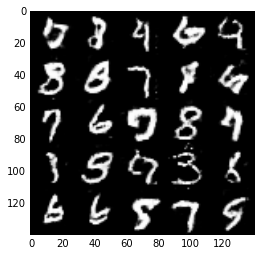

Epoch 2/2... Discriminator Loss: 0.7964... Generator Loss: 1.1991
Epoch 2/2... Discriminator Loss: 1.0237... Generator Loss: 0.8880
Epoch 2/2... Discriminator Loss: 0.7756... Generator Loss: 1.3054
Epoch 2/2... Discriminator Loss: 0.7191... Generator Loss: 1.3158
Epoch 2/2... Discriminator Loss: 0.7301... Generator Loss: 1.5741
Epoch 2/2... Discriminator Loss: 0.6080... Generator Loss: 1.8203
Epoch 2/2... Discriminator Loss: 0.7986... Generator Loss: 1.4215
Epoch 2/2... Discriminator Loss: 0.6375... Generator Loss: 1.5397
Epoch 2/2... Discriminator Loss: 0.6711... Generator Loss: 1.4206
Epoch 2/2... Discriminator Loss: 1.1834... Generator Loss: 0.6702


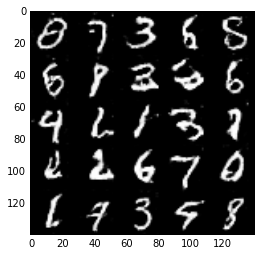

Epoch 2/2... Discriminator Loss: 1.4591... Generator Loss: 0.4869
Epoch 2/2... Discriminator Loss: 0.7628... Generator Loss: 1.4171
Epoch 2/2... Discriminator Loss: 0.9641... Generator Loss: 0.8858
Epoch 2/2... Discriminator Loss: 1.3654... Generator Loss: 3.6575
Epoch 2/2... Discriminator Loss: 0.8476... Generator Loss: 1.2533
Epoch 2/2... Discriminator Loss: 0.8014... Generator Loss: 1.5247
Epoch 2/2... Discriminator Loss: 0.6457... Generator Loss: 1.6253
Epoch 2/2... Discriminator Loss: 0.6529... Generator Loss: 1.4364
Epoch 2/2... Discriminator Loss: 0.9020... Generator Loss: 2.0207
Epoch 2/2... Discriminator Loss: 0.8833... Generator Loss: 0.9787


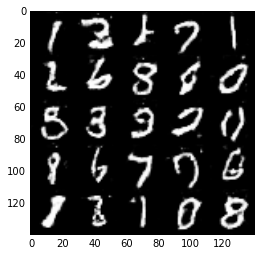

Epoch 2/2... Discriminator Loss: 0.7909... Generator Loss: 1.2915
Epoch 2/2... Discriminator Loss: 2.2594... Generator Loss: 0.3216
Epoch 2/2... Discriminator Loss: 0.7664... Generator Loss: 1.2834
Epoch 2/2... Discriminator Loss: 0.7068... Generator Loss: 1.4526
Epoch 2/2... Discriminator Loss: 0.6046... Generator Loss: 1.6531
Epoch 2/2... Discriminator Loss: 1.0233... Generator Loss: 0.7970
Epoch 2/2... Discriminator Loss: 1.5575... Generator Loss: 0.4570
Epoch 2/2... Discriminator Loss: 1.0704... Generator Loss: 0.8509
Epoch 2/2... Discriminator Loss: 0.7968... Generator Loss: 1.9541
Epoch 2/2... Discriminator Loss: 0.5829... Generator Loss: 2.7422


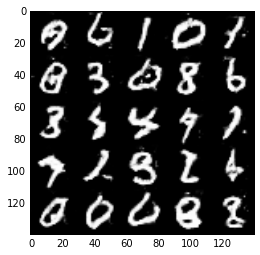

Epoch 2/2... Discriminator Loss: 0.6046... Generator Loss: 1.6891
Epoch 2/2... Discriminator Loss: 1.7026... Generator Loss: 4.1383
Epoch 2/2... Discriminator Loss: 0.6984... Generator Loss: 1.4437
Epoch 2/2... Discriminator Loss: 1.6079... Generator Loss: 0.3947
Epoch 2/2... Discriminator Loss: 0.6772... Generator Loss: 1.3248
Epoch 2/2... Discriminator Loss: 0.8568... Generator Loss: 1.0846
Epoch 2/2... Discriminator Loss: 1.0573... Generator Loss: 0.8832
Epoch 2/2... Discriminator Loss: 0.9506... Generator Loss: 0.9758
Epoch 2/2... Discriminator Loss: 1.0134... Generator Loss: 0.8667
Epoch 2/2... Discriminator Loss: 1.0468... Generator Loss: 0.7921


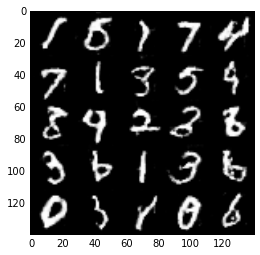

Epoch 2/2... Discriminator Loss: 1.5425... Generator Loss: 0.6347
Epoch 2/2... Discriminator Loss: 1.8966... Generator Loss: 0.4165
Epoch 2/2... Discriminator Loss: 1.0565... Generator Loss: 0.8363
Epoch 2/2... Discriminator Loss: 1.2623... Generator Loss: 0.6717
Epoch 2/2... Discriminator Loss: 1.0917... Generator Loss: 0.7040


In [18]:
batch_size = 32
z_dim = 150
learning_rate = 0.00025
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.6868... Generator Loss: 3.4743
Epoch 1/1... Discriminator Loss: 5.0936... Generator Loss: 0.0109
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 9.0878
Epoch 1/1... Discriminator Loss: 0.5193... Generator Loss: 4.4249
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 10.4866
Epoch 1/1... Discriminator Loss: 1.6823... Generator Loss: 7.8542
Epoch 1/1... Discriminator Loss: 0.7248... Generator Loss: 3.2176
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 0.8653... Generator Loss: 1.2867
Epoch 1/1... Discriminator Loss: 0.8653... Generator Loss: 1.6003


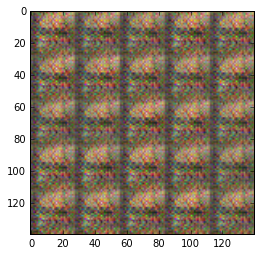

Epoch 1/1... Discriminator Loss: 0.5649... Generator Loss: 1.9924
Epoch 1/1... Discriminator Loss: 0.5387... Generator Loss: 2.0021
Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 2.0626
Epoch 1/1... Discriminator Loss: 0.6227... Generator Loss: 1.7818
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 1.0246
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.5666
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.5546
Epoch 1/1... Discriminator Loss: 0.9267... Generator Loss: 1.4411
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 1.5888
Epoch 1/1... Discriminator Loss: 0.9829... Generator Loss: 1.5163


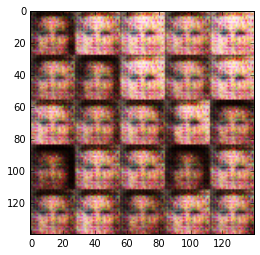

Epoch 1/1... Discriminator Loss: 1.2409... Generator Loss: 0.7742
Epoch 1/1... Discriminator Loss: 0.9828... Generator Loss: 1.3890
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 1.4259
Epoch 1/1... Discriminator Loss: 1.0738... Generator Loss: 1.3338
Epoch 1/1... Discriminator Loss: 0.9120... Generator Loss: 1.1051
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.7761
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 1.0043... Generator Loss: 1.5166
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 2.6512
Epoch 1/1... Discriminator Loss: 1.3451... Generator Loss: 0.8585


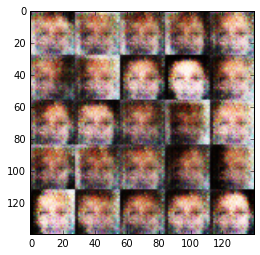

Epoch 1/1... Discriminator Loss: 1.5993... Generator Loss: 0.4204
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.1175... Generator Loss: 0.9153
Epoch 1/1... Discriminator Loss: 0.9476... Generator Loss: 1.3745
Epoch 1/1... Discriminator Loss: 1.1679... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 1.0086... Generator Loss: 1.0170
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 1.0558
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 1.1467
Epoch 1/1... Discriminator Loss: 1.2684... Generator Loss: 1.0596
Epoch 1/1... Discriminator Loss: 1.6478... Generator Loss: 0.6536


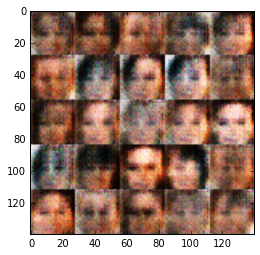

Epoch 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.4933
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.8138
Epoch 1/1... Discriminator Loss: 1.8673... Generator Loss: 0.3262
Epoch 1/1... Discriminator Loss: 1.4808... Generator Loss: 1.9846
Epoch 1/1... Discriminator Loss: 1.1137... Generator Loss: 1.1383
Epoch 1/1... Discriminator Loss: 1.4918... Generator Loss: 0.5095
Epoch 1/1... Discriminator Loss: 1.0641... Generator Loss: 1.2991
Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 1.1320
Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.8827
Epoch 1/1... Discriminator Loss: 1.5973... Generator Loss: 0.6451


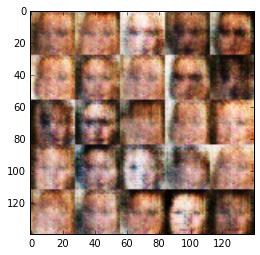

Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 1.1947
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.6488... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.6046
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.5958
Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.2623... Generator Loss: 1.0458
Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 1.0451
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 1.5042
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 1.2333


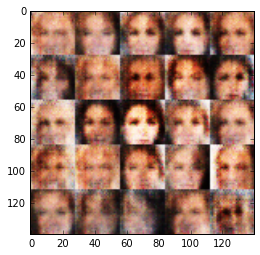

Epoch 1/1... Discriminator Loss: 1.4719... Generator Loss: 0.4982
Epoch 1/1... Discriminator Loss: 1.1935... Generator Loss: 1.0008
Epoch 1/1... Discriminator Loss: 1.2656... Generator Loss: 0.8923
Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 1.0507
Epoch 1/1... Discriminator Loss: 1.2350... Generator Loss: 1.3054
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.8929
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.5969... Generator Loss: 0.4353
Epoch 1/1... Discriminator Loss: 1.5856... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.3089... Generator Loss: 0.8803


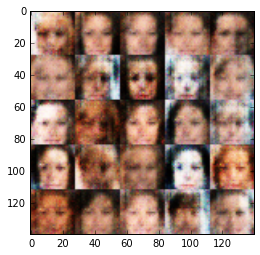

Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.9668
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.6408
Epoch 1/1... Discriminator Loss: 1.4200... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3131... Generator Loss: 0.9192
Epoch 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.9202
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 0.8951
Epoch 1/1... Discriminator Loss: 1.3601... Generator Loss: 0.5507


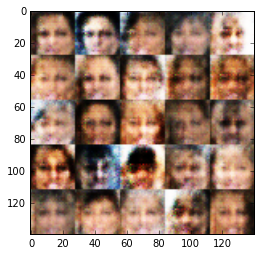

Epoch 1/1... Discriminator Loss: 1.2066... Generator Loss: 0.9099
Epoch 1/1... Discriminator Loss: 1.4955... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 1.6177... Generator Loss: 0.4292
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 1.0439
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.2041... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.9731
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.9133


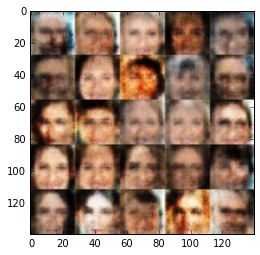

Epoch 1/1... Discriminator Loss: 1.2227... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 1.4749
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 1.1485
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.8866
Epoch 1/1... Discriminator Loss: 1.3100... Generator Loss: 0.9264
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 1.1281... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.2843... Generator Loss: 1.2970
Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 1.0971
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.8469


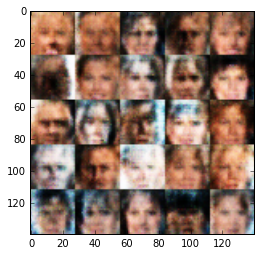

Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.9598
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.6448
Epoch 1/1... Discriminator Loss: 1.1848... Generator Loss: 0.9797
Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.1977... Generator Loss: 0.9179
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 1.0730
Epoch 1/1... Discriminator Loss: 1.2204... Generator Loss: 1.0156
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.5025


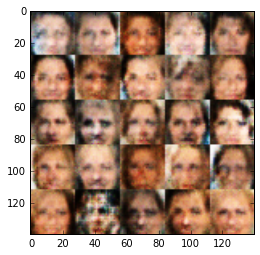

Epoch 1/1... Discriminator Loss: 1.2335... Generator Loss: 0.8031
Epoch 1/1... Discriminator Loss: 1.2371... Generator Loss: 0.8794
Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.4997
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.7181
Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.5381
Epoch 1/1... Discriminator Loss: 1.5177... Generator Loss: 1.3275
Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.6123
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.6184
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.6278


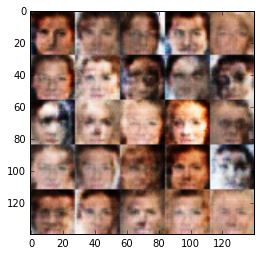

Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 1.0113
Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.8151
Epoch 1/1... Discriminator Loss: 1.2980... Generator Loss: 1.1974
Epoch 1/1... Discriminator Loss: 1.4635... Generator Loss: 1.3270
Epoch 1/1... Discriminator Loss: 1.4727... Generator Loss: 0.4733
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.8741
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 1.0929
Epoch 1/1... Discriminator Loss: 1.2596... Generator Loss: 1.0608
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 0.5830


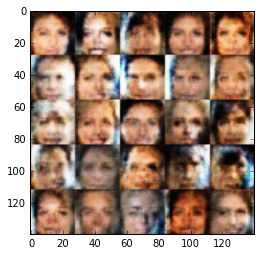

Epoch 1/1... Discriminator Loss: 1.2971... Generator Loss: 1.4599
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 1.1080
Epoch 1/1... Discriminator Loss: 1.1978... Generator Loss: 0.8415
Epoch 1/1... Discriminator Loss: 1.4723... Generator Loss: 1.0776
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.5741
Epoch 1/1... Discriminator Loss: 1.1811... Generator Loss: 0.9501
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 1.1889
Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.8437
Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.7960


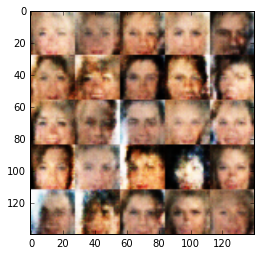

Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.9388
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.8638
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.1382... Generator Loss: 1.1580
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 1.2542
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.8456
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 1.2036
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.6111
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 1.0510


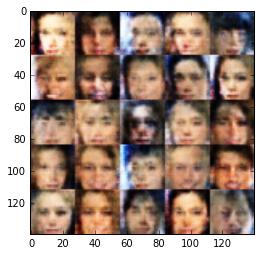

Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 0.6264
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.9038
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.5163
Epoch 1/1... Discriminator Loss: 1.2432... Generator Loss: 0.8531
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 1.0711
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.8697
Epoch 1/1... Discriminator Loss: 1.3291... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.4756... Generator Loss: 0.5086


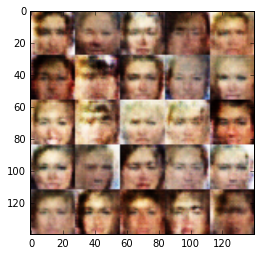

Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.6008
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.6375
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.2114... Generator Loss: 0.8355
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 1.1014
Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 1.0479
Epoch 1/1... Discriminator Loss: 1.4630... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 1.3140
Epoch 1/1... Discriminator Loss: 1.2093... Generator Loss: 0.8678


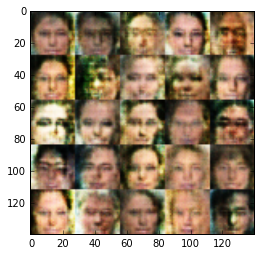

Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 0.8389
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 0.9243
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.7848
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 1.0814
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 1.1759
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 1.0911


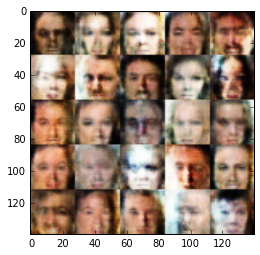

Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.5597
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.5738
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 0.9270
Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 1.3016
Epoch 1/1... Discriminator Loss: 1.2089... Generator Loss: 0.8781
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.3069... Generator Loss: 0.9332
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.6637


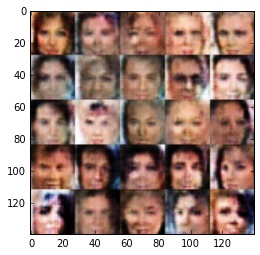

Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 1.0082
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.8552
Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.4158
Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 1.5005
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 1.2293
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.9200
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 1.2292


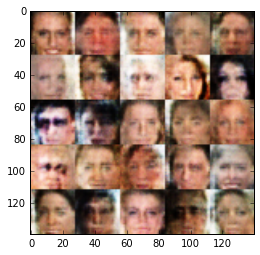

Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.3053... Generator Loss: 0.9515
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.5131
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.6878
Epoch 1/1... Discriminator Loss: 1.2314... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 1.2649... Generator Loss: 0.6851
Epoch 1/1... Discriminator Loss: 1.2375... Generator Loss: 1.0403
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.4893


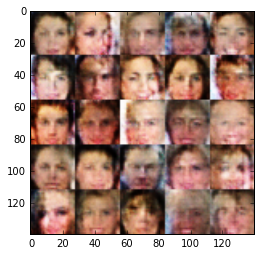

Epoch 1/1... Discriminator Loss: 1.2401... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 1.0293
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 1.2974
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.6880
Epoch 1/1... Discriminator Loss: 1.2907... Generator Loss: 0.6165
Epoch 1/1... Discriminator Loss: 1.4146... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 1.3405
Epoch 1/1... Discriminator Loss: 1.2101... Generator Loss: 0.9088
Epoch 1/1... Discriminator Loss: 1.4893... Generator Loss: 0.4712
Epoch 1/1... Discriminator Loss: 1.5248... Generator Loss: 0.4562


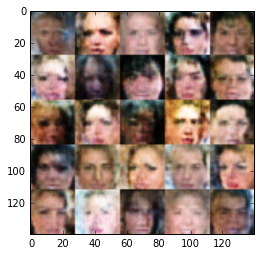

Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 1.0328
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.4985... Generator Loss: 0.4483
Epoch 1/1... Discriminator Loss: 1.4708... Generator Loss: 0.4948
Epoch 1/1... Discriminator Loss: 1.4077... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.2439... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.7189
Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.6977


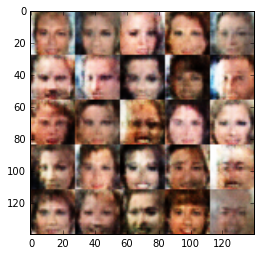

Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.9294
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.8593
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.5067
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.6604
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.9459
Epoch 1/1... Discriminator Loss: 1.2055... Generator Loss: 0.8832
Epoch 1/1... Discriminator Loss: 1.1683... Generator Loss: 0.8332
Epoch 1/1... Discriminator Loss: 1.2166... Generator Loss: 0.7437


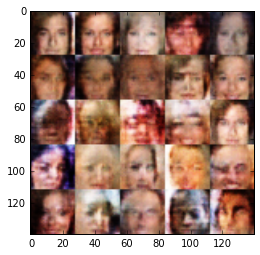

Epoch 1/1... Discriminator Loss: 1.4455... Generator Loss: 0.4962
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 1.2933... Generator Loss: 0.8936
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.1754... Generator Loss: 0.8002
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 1.0578
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 1.1896
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.3167... Generator Loss: 0.8401


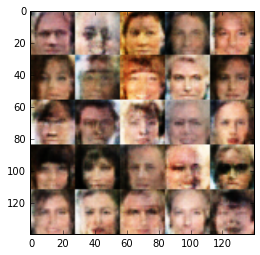

Epoch 1/1... Discriminator Loss: 1.0967... Generator Loss: 0.8315
Epoch 1/1... Discriminator Loss: 1.3335... Generator Loss: 0.9408
Epoch 1/1... Discriminator Loss: 1.1849... Generator Loss: 0.8571
Epoch 1/1... Discriminator Loss: 1.4053... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.2314... Generator Loss: 0.8421
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.5091... Generator Loss: 0.4669
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 1.0102
Epoch 1/1... Discriminator Loss: 1.5467... Generator Loss: 0.4130
Epoch 1/1... Discriminator Loss: 1.2335... Generator Loss: 0.9357


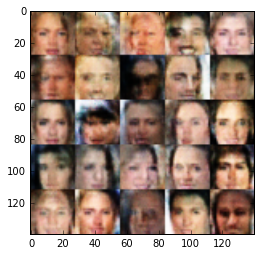

Epoch 1/1... Discriminator Loss: 1.2170... Generator Loss: 0.8379
Epoch 1/1... Discriminator Loss: 1.2947... Generator Loss: 0.8265
Epoch 1/1... Discriminator Loss: 1.0797... Generator Loss: 0.8638
Epoch 1/1... Discriminator Loss: 1.2810... Generator Loss: 0.6864
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 1.2066
Epoch 1/1... Discriminator Loss: 1.0275... Generator Loss: 0.9491
Epoch 1/1... Discriminator Loss: 1.3572... Generator Loss: 1.2062
Epoch 1/1... Discriminator Loss: 1.6162... Generator Loss: 0.3658
Epoch 1/1... Discriminator Loss: 1.5020... Generator Loss: 0.4353
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.7232


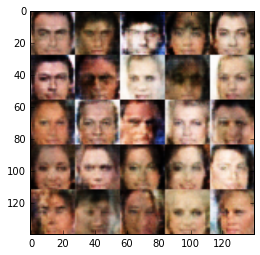

Epoch 1/1... Discriminator Loss: 1.2823... Generator Loss: 1.0704
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 1.0397
Epoch 1/1... Discriminator Loss: 1.3010... Generator Loss: 1.1730
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 0.9451
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.4978
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.6430
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.6252


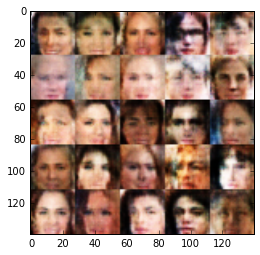

Epoch 1/1... Discriminator Loss: 1.1981... Generator Loss: 1.1136
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.6321
Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.9327
Epoch 1/1... Discriminator Loss: 1.2756... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 0.9908
Epoch 1/1... Discriminator Loss: 1.3281... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 0.9033
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.9727
Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 1.0146
Epoch 1/1... Discriminator Loss: 1.5274... Generator Loss: 0.4275


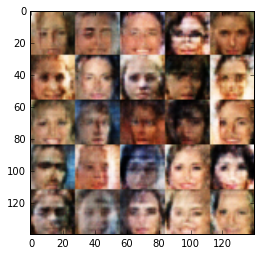

Epoch 1/1... Discriminator Loss: 1.1695... Generator Loss: 1.1161
Epoch 1/1... Discriminator Loss: 1.1822... Generator Loss: 0.7886
Epoch 1/1... Discriminator Loss: 1.1999... Generator Loss: 0.9824
Epoch 1/1... Discriminator Loss: 1.2110... Generator Loss: 0.9068
Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.1420... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.4668... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.0703... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.6007
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.5784


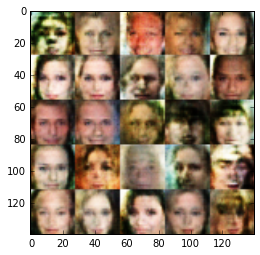

Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.5900... Generator Loss: 0.3709
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 1.0192
Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.5344
Epoch 1/1... Discriminator Loss: 1.2124... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 1.1798... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 1.5385... Generator Loss: 0.4654
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.7839


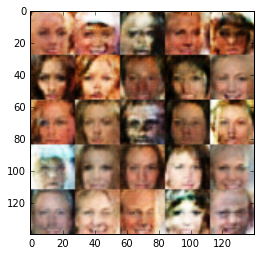

Epoch 1/1... Discriminator Loss: 1.4464... Generator Loss: 0.4831
Epoch 1/1... Discriminator Loss: 1.5526... Generator Loss: 0.5024
Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.2807... Generator Loss: 1.3722
Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 1.0401
Epoch 1/1... Discriminator Loss: 1.2425... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 1.6090... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.4863... Generator Loss: 0.5211


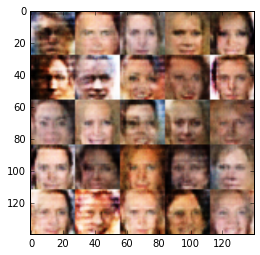

Epoch 1/1... Discriminator Loss: 1.2491... Generator Loss: 0.7910
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.8664
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.9255
Epoch 1/1... Discriminator Loss: 1.0753... Generator Loss: 1.2400
Epoch 1/1... Discriminator Loss: 1.1604... Generator Loss: 1.1159
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.2644... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.6291


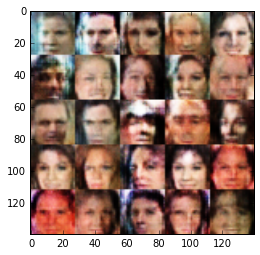

Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 1.0121
Epoch 1/1... Discriminator Loss: 1.5561... Generator Loss: 0.4443
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.5537
Epoch 1/1... Discriminator Loss: 1.3456... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.6106
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.5920
Epoch 1/1... Discriminator Loss: 1.5937... Generator Loss: 0.3957
Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 1.0092
Epoch 1/1... Discriminator Loss: 1.1001... Generator Loss: 1.2042
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 1.1922


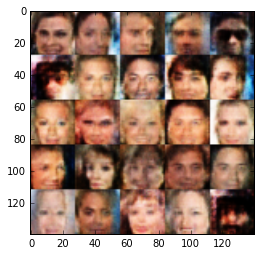

Epoch 1/1... Discriminator Loss: 1.0676... Generator Loss: 0.9055
Epoch 1/1... Discriminator Loss: 1.1937... Generator Loss: 0.8715
Epoch 1/1... Discriminator Loss: 1.3386... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.2473... Generator Loss: 0.8158
Epoch 1/1... Discriminator Loss: 1.3047... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 0.7151
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.8400
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.5245


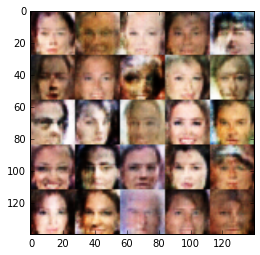

Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.8104
Epoch 1/1... Discriminator Loss: 1.2826... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.5984
Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.9672
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 0.9733
Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.8530
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 1.5813
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.7141


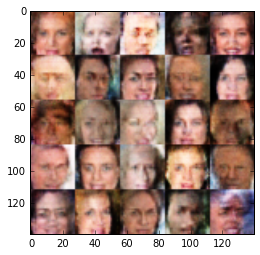

Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.5343
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.3893... Generator Loss: 0.4908
Epoch 1/1... Discriminator Loss: 1.4320... Generator Loss: 0.4939
Epoch 1/1... Discriminator Loss: 1.1275... Generator Loss: 1.1385
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 1.1194
Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.5156
Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 1.1846


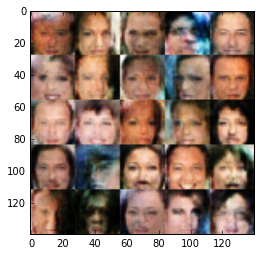

Epoch 1/1... Discriminator Loss: 1.6285... Generator Loss: 0.3671
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.0991... Generator Loss: 0.9284
Epoch 1/1... Discriminator Loss: 1.4841... Generator Loss: 0.4410
Epoch 1/1... Discriminator Loss: 1.3433... Generator Loss: 0.8742
Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.9684
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.5224
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.5390
Epoch 1/1... Discriminator Loss: 1.2075... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.1972... Generator Loss: 0.6248


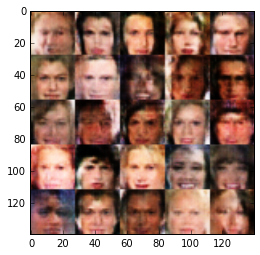

Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.9222
Epoch 1/1... Discriminator Loss: 1.1360... Generator Loss: 0.7806
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 1.0262
Epoch 1/1... Discriminator Loss: 1.1810... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.2487... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.8711
Epoch 1/1... Discriminator Loss: 1.2464... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 1.1879
Epoch 1/1... Discriminator Loss: 1.2289... Generator Loss: 1.1297


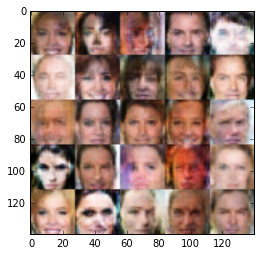

Epoch 1/1... Discriminator Loss: 1.4868... Generator Loss: 0.5031
Epoch 1/1... Discriminator Loss: 1.1381... Generator Loss: 0.9077
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 1.0046
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.7247
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 0.8265... Generator Loss: 1.3372
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.1799... Generator Loss: 0.9519
Epoch 1/1... Discriminator Loss: 1.3824... Generator Loss: 0.6359
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.4822


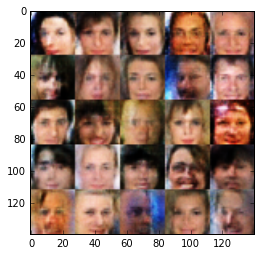

Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.5733
Epoch 1/1... Discriminator Loss: 1.3942... Generator Loss: 0.6067
Epoch 1/1... Discriminator Loss: 1.4696... Generator Loss: 0.4304
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.4915
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.5372
Epoch 1/1... Discriminator Loss: 1.3270... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.4645... Generator Loss: 0.5784
Epoch 1/1... Discriminator Loss: 1.1120... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 1.1140... Generator Loss: 1.1316
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.4743


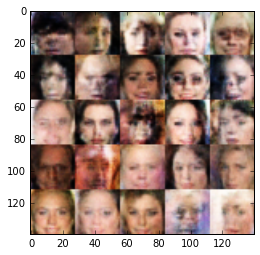

Epoch 1/1... Discriminator Loss: 1.1656... Generator Loss: 0.9149
Epoch 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.5453
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 1.0010
Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 0.9283
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 1.2084
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.7051


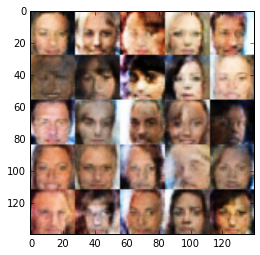

Epoch 1/1... Discriminator Loss: 1.1584... Generator Loss: 1.0986
Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.7765
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 1.0027
Epoch 1/1... Discriminator Loss: 1.2777... Generator Loss: 0.7649
Epoch 1/1... Discriminator Loss: 0.9771... Generator Loss: 1.0557
Epoch 1/1... Discriminator Loss: 1.1416... Generator Loss: 0.7819
Epoch 1/1... Discriminator Loss: 1.1178... Generator Loss: 0.9037
Epoch 1/1... Discriminator Loss: 1.2079... Generator Loss: 1.4218
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.9425
Epoch 1/1... Discriminator Loss: 1.3781... Generator Loss: 0.7119


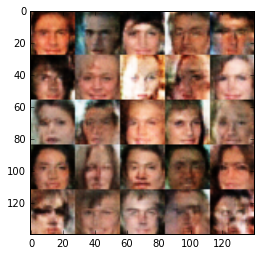

Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.7599
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.7411
Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.7899
Epoch 1/1... Discriminator Loss: 1.3361... Generator Loss: 0.5930
Epoch 1/1... Discriminator Loss: 1.1462... Generator Loss: 1.0502
Epoch 1/1... Discriminator Loss: 1.2707... Generator Loss: 0.6448
Epoch 1/1... Discriminator Loss: 1.4669... Generator Loss: 0.4725
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 1.0348
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.2748... Generator Loss: 0.6451


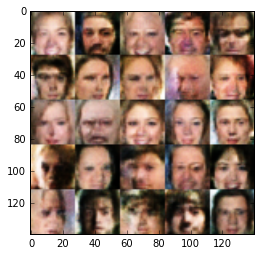

Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 1.1738
Epoch 1/1... Discriminator Loss: 1.5620... Generator Loss: 0.4144
Epoch 1/1... Discriminator Loss: 1.0664... Generator Loss: 0.8686
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.9622
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.4741
Epoch 1/1... Discriminator Loss: 1.0930... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 1.5505... Generator Loss: 0.4340
Epoch 1/1... Discriminator Loss: 1.1093... Generator Loss: 0.9885


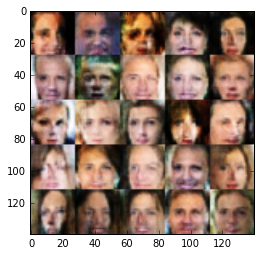

Epoch 1/1... Discriminator Loss: 1.2533... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.3045... Generator Loss: 0.6065
Epoch 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.2481... Generator Loss: 1.0064
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 1.1687
Epoch 1/1... Discriminator Loss: 1.0381... Generator Loss: 1.2043
Epoch 1/1... Discriminator Loss: 0.9436... Generator Loss: 0.9904


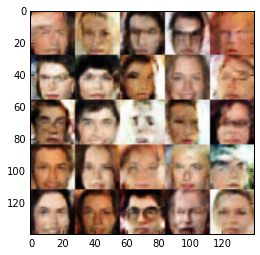

Epoch 1/1... Discriminator Loss: 1.1536... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 1.2508... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.6386
Epoch 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.7350
Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.5224
Epoch 1/1... Discriminator Loss: 1.3774... Generator Loss: 1.0419
Epoch 1/1... Discriminator Loss: 1.5473... Generator Loss: 0.3924
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 1.2547


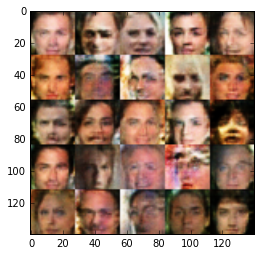

Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 0.8399
Epoch 1/1... Discriminator Loss: 1.1512... Generator Loss: 0.8994
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 0.5287
Epoch 1/1... Discriminator Loss: 1.3989... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 1.2392
Epoch 1/1... Discriminator Loss: 1.3181... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.4710... Generator Loss: 0.4458
Epoch 1/1... Discriminator Loss: 1.1736... Generator Loss: 0.7674


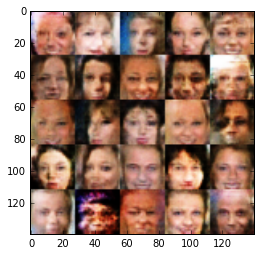

Epoch 1/1... Discriminator Loss: 1.2007... Generator Loss: 0.8684
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.5485
Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 1.1012
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 0.6517
Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.6715... Generator Loss: 0.3572
Epoch 1/1... Discriminator Loss: 1.4015... Generator Loss: 0.4975
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.9185
Epoch 1/1... Discriminator Loss: 1.0001... Generator Loss: 1.0192
Epoch 1/1... Discriminator Loss: 1.3688... Generator Loss: 0.5337


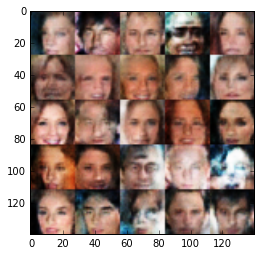

Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.5032
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.1833... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.0904... Generator Loss: 1.1552
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.4582... Generator Loss: 0.6857
Epoch 1/1... Discriminator Loss: 1.1811... Generator Loss: 0.6519
Epoch 1/1... Discriminator Loss: 1.2406... Generator Loss: 0.6653
Epoch 1/1... Discriminator Loss: 1.2399... Generator Loss: 0.9848
Epoch 1/1... Discriminator Loss: 1.1425... Generator Loss: 1.1943


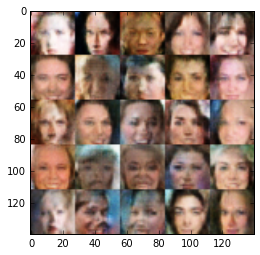

Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 1.3257
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.6793
Epoch 1/1... Discriminator Loss: 1.4795... Generator Loss: 0.4446
Epoch 1/1... Discriminator Loss: 1.1546... Generator Loss: 0.8982
Epoch 1/1... Discriminator Loss: 1.1005... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 1.4040... Generator Loss: 0.5393
Epoch 1/1... Discriminator Loss: 1.1920... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.3162... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.2720... Generator Loss: 0.6642
Epoch 1/1... Discriminator Loss: 1.3594... Generator Loss: 0.6220


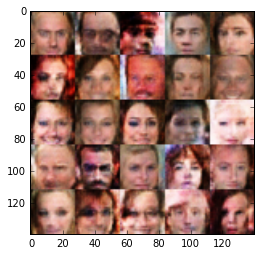

Epoch 1/1... Discriminator Loss: 1.6875... Generator Loss: 0.3474
Epoch 1/1... Discriminator Loss: 1.2767... Generator Loss: 0.6740
Epoch 1/1... Discriminator Loss: 1.3071... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.4002... Generator Loss: 0.4900
Epoch 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.8228
Epoch 1/1... Discriminator Loss: 1.0925... Generator Loss: 1.0307
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.6015
Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 1.0393
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.7875
Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 0.8197


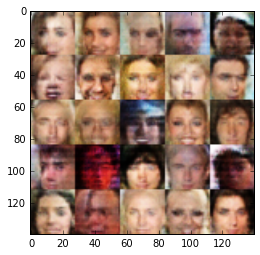

Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 1.4436
Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 0.9605
Epoch 1/1... Discriminator Loss: 1.5390... Generator Loss: 0.4057
Epoch 1/1... Discriminator Loss: 1.2200... Generator Loss: 0.8030
Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 0.6225
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.2214... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.5628... Generator Loss: 0.4984
Epoch 1/1... Discriminator Loss: 1.2844... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 0.8842


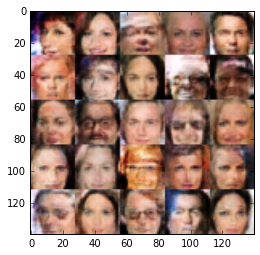

Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.5230
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 1.2869
Epoch 1/1... Discriminator Loss: 1.6779... Generator Loss: 0.3386
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 0.6851
Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.2434... Generator Loss: 1.0007
Epoch 1/1... Discriminator Loss: 1.1849... Generator Loss: 0.6938
Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.9923
Epoch 1/1... Discriminator Loss: 1.1140... Generator Loss: 1.4415
Epoch 1/1... Discriminator Loss: 1.0672... Generator Loss: 1.1361


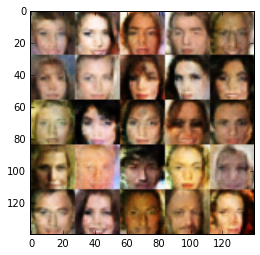

Epoch 1/1... Discriminator Loss: 1.2688... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.0357... Generator Loss: 0.9253
Epoch 1/1... Discriminator Loss: 1.2600... Generator Loss: 0.9542
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.5992
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 0.5980
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.5354
Epoch 1/1... Discriminator Loss: 0.9376... Generator Loss: 1.1219
Epoch 1/1... Discriminator Loss: 1.6526... Generator Loss: 0.3535
Epoch 1/1... Discriminator Loss: 1.2248... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.7410


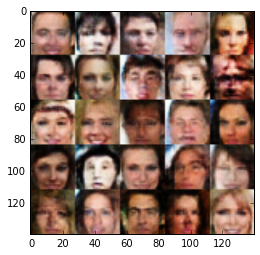

Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.6480
Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.4623
Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 1.6911... Generator Loss: 0.3289
Epoch 1/1... Discriminator Loss: 1.5023... Generator Loss: 0.4302
Epoch 1/1... Discriminator Loss: 1.2615... Generator Loss: 0.6322
Epoch 1/1... Discriminator Loss: 0.9848... Generator Loss: 1.1088
Epoch 1/1... Discriminator Loss: 1.2388... Generator Loss: 0.5969
Epoch 1/1... Discriminator Loss: 1.1033... Generator Loss: 0.9765
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 0.7060


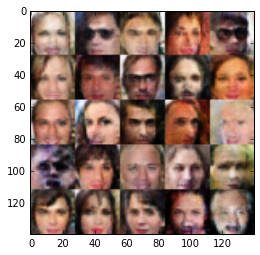

Epoch 1/1... Discriminator Loss: 1.7286... Generator Loss: 0.3452
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.9249
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.8531
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.5415... Generator Loss: 0.4019
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 1.0539
Epoch 1/1... Discriminator Loss: 1.0606... Generator Loss: 1.0780
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 1.0582


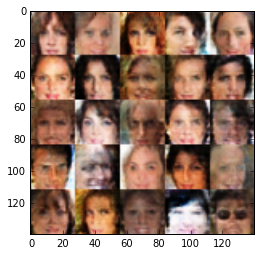

Epoch 1/1... Discriminator Loss: 1.2715... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 0.9945... Generator Loss: 1.1895
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.4730
Epoch 1/1... Discriminator Loss: 1.5754... Generator Loss: 0.3844
Epoch 1/1... Discriminator Loss: 1.3965... Generator Loss: 0.5222
Epoch 1/1... Discriminator Loss: 1.1766... Generator Loss: 0.8977
Epoch 1/1... Discriminator Loss: 1.1142... Generator Loss: 0.9663
Epoch 1/1... Discriminator Loss: 1.1481... Generator Loss: 1.0237
Epoch 1/1... Discriminator Loss: 1.3157... Generator Loss: 0.5221
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.7391


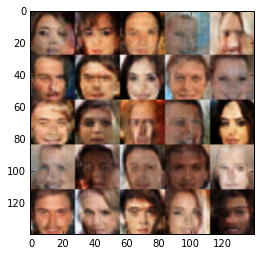

Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.5872
Epoch 1/1... Discriminator Loss: 1.2508... Generator Loss: 0.6089
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.4775
Epoch 1/1... Discriminator Loss: 1.1037... Generator Loss: 0.9874
Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.8667
Epoch 1/1... Discriminator Loss: 1.0898... Generator Loss: 1.0594
Epoch 1/1... Discriminator Loss: 1.2602... Generator Loss: 0.6042
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 0.9394
Epoch 1/1... Discriminator Loss: 1.3065... Generator Loss: 0.6177
Epoch 1/1... Discriminator Loss: 1.1156... Generator Loss: 1.3466


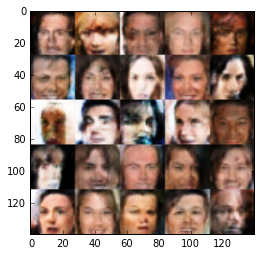

Epoch 1/1... Discriminator Loss: 1.1398... Generator Loss: 0.8028
Epoch 1/1... Discriminator Loss: 1.2272... Generator Loss: 0.9402
Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.5730
Epoch 1/1... Discriminator Loss: 0.9715... Generator Loss: 0.9641
Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 0.7882
Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.2774... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.7565... Generator Loss: 0.3078
Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.6961


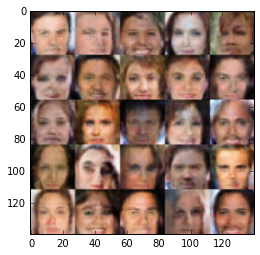

Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 1.2062... Generator Loss: 0.6498
Epoch 1/1... Discriminator Loss: 1.1654... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.9981
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.5996
Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.9103
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.6104
Epoch 1/1... Discriminator Loss: 1.2370... Generator Loss: 0.6437


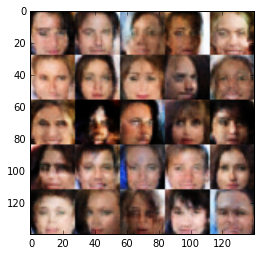

Epoch 1/1... Discriminator Loss: 1.5116... Generator Loss: 0.4254
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 0.8475
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.6020
Epoch 1/1... Discriminator Loss: 1.1532... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.3965... Generator Loss: 0.4896
Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.7914
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.5195
Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 1.0719... Generator Loss: 1.0598
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.4701


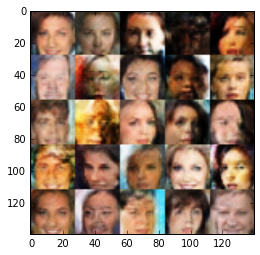

Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.5765... Generator Loss: 0.4138
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.4893
Epoch 1/1... Discriminator Loss: 1.0677... Generator Loss: 1.4950
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 1.0717
Epoch 1/1... Discriminator Loss: 1.1851... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.5240... Generator Loss: 0.4484
Epoch 1/1... Discriminator Loss: 1.2295... Generator Loss: 0.8626


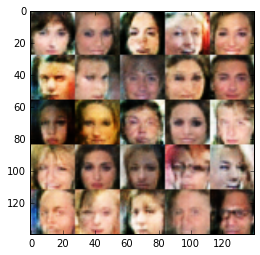

Epoch 1/1... Discriminator Loss: 0.9974... Generator Loss: 1.4617
Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 0.9071
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.6250


In [19]:
batch_size = 32
z_dim = 150
learning_rate = 0.00025
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.